## Importing Packages and Data

In [1]:
import pandas as pd
pd.set_option('max_rows', 30)
pd.set_option('max_columns', 100)
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas_profiling
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Loading csv dataset
file = ("C:\\Users\\Connor Higgins\\Documents\\DataScience2019\\TestInnovators\\"
        "usersections_revised.csv")
df_init = pd.read_csv(file)

## Initial Exploration

In [28]:
# Generating dataset profile report
# pandas_profiling.ProfileReport(df_init)
print(df_init.info())
df_init.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70411 entries, 0 to 70410
Data columns (total 20 columns):
userSectionId        70411 non-null int64
duration             70411 non-null int64
totalDuration        70411 non-null int64
correct              70411 non-null int64
incorrect            70411 non-null int64
blank                70411 non-null int64
questionCount        70411 non-null int64
answer               67152 non-null object
correct.1            70411 non-null int64
questionSectionId    70411 non-null int64
duration.1           70411 non-null int64
flagged              70411 non-null int64
questionType         70411 non-null object
keywordId            70411 non-null int64
keyword              70411 non-null object
bankId               70411 non-null int64
bankDescription      70411 non-null object
difficulty           70411 non-null int64
familyId             70411 non-null int64
familyDescription    70411 non-null object
dtypes: int64(15), object(5)
memory usage: 10.

,userSectionId,duration,totalDuration,correct,incorrect,blank,questionCount,correct.1,questionSectionId,duration.1,flagged,keywordId,bankId,difficulty,familyId
count,70411.000000,70411.000000,70411.000000,70411.000000,70411.000000,70411.000000,70411.0,70411.000000,70411.000000,70411.000000,70411.000000,70411.000000,70411.000000,70411.000000,70411.000000
mean,118750.963741,1476.205991,2156.831319,20.908040,14.379401,1.712559,37.0,0.565082,6863.000000,40.767877,0.032452,9.837838,320.027027,2.324324,33.756757
std,34920.974953,731.315687,237.579224,7.207907,6.920514,4.142130,0.0,0.495750,10.677154,52.973009,0.177199,4.727832,189.737506,0.807205,14.544361
min,62341.000000,0.000000,2100.000000,2.000000,0.000000,0.000000,37.0,0.000000,6845.000000,0.000000,0.000000,6.000000,31.000000,1.000000,3.000000
25%,86478.000000,1153.000000,2100.000000,15.000000,9.000000,0.000000,37.0,0.000000,6854.000000,11.000000,0.000000,6.000000,134.000000,2.000000,22.000000
50%,116842.000000,1721.000000,2100.000000,20.000000,14.000000,0.000000,37.0,1.000000,6863.000000,27.000000,0.000000,8.000000,389.000000,3.000000,40.000000
75%,150907.000000,2091.000000,2100.000000,26.000000,20.000000,0.000000,37.0,1.000000,6872.000000,52.000000,0.000000,9.000000,454.000000,3.000000,44.000000
max,224942.000000,3150.000000,3150.000000,37.000000,32.000000,18.000000,37.0,1.000000,6881.000000,3399.000000,1.000000,18.000000,636.000000,3.000000,58.000000


In [4]:
# Determining question category relations
groupingsbank = df_init.groupby('keyword')['bankDescription'].agg(lambda x: list(set(list(x))))
print('--bankDescription categories--')
for i in range(len(groupingsbank)):
    print('-' + groupingsbank.index[i] + '-')
    print(groupingsbank[i])

df_init['familyDescription'] = df_init['familyDescription'].str.replace('&amp;', 'AND')
groupingsfaml = df_init.groupby('keyword')['familyDescription'].agg(lambda x: list(set(list(x))))
print('\n--familyDescription categories--')
for i in range(len(groupingsfaml)):
    print('-' + groupingsfaml.index[i] + '-')
    print(groupingsfaml[i])

--bankDescription categories--
-Algebraic Concepts-
['FOIL vs. Quadratic Expression', 'Special (Symbol) Functions', 'Comparing Exponential Expressions w. Variables', 'Exponential Expressions with 1 Variable', 'Solving for Expressions', 'Solving 1 Variable Equations', 'Solving for Missing Constants with FOIL', 'Comparing "Open-Ended" Variable Expressions', 'Comparing Slopes - Quantitative Comparison', 'Comparing Figures w. Variable Sides', 'Square Root vs. Square']
-Data Analysis & Probability-
['Interpreting Graphs Modeling a Scenario', 'Patterns with Exponentials', 'Comparing MMMR, given Histograms & Frequency Tables', 'Probability of Desired Sum of Independent Events', 'Finding Missing Value, given Set of Numbers + Changing Mean', 'Probability of 1 Event', 'Probability of 2 Independent Events', 'Finding Changes in MMMR after Adjusting Data Values']
-Geometry-
['Perimeter of Triangle, given Area', 'Comparing Volume of Spheres', 'Y-intercepts, given Graphs', 'Ratios of Similar 2-D Figu

## Preprocessing

In [5]:
# Obtaining keyword scores and timing
keyword_scores = pd.pivot_table(df_init, values='correct.1', index=['userSectionId'],
                                columns=['keyword'], aggfunc=np.sum)
keyword_scores.columns = [str(col) + ' Q.Score' for col in keyword_scores.columns]
keyword_timing = pd.pivot_table(df_init, values='duration.1', index=['userSectionId'],
                                columns=['keyword'], aggfunc=np.sum)
keyword_timing.columns = [str(col) + ' Q.Time' for col in keyword_timing.columns]
keyword_scores.join(keyword_timing)

,Algebraic Concepts Q.Score,Data Analysis & Probability Q.Score,Geometry Q.Score,Measurement Q.Score,Number Properties Q.Score,Algebraic Concepts Q.Time,Data Analysis & Probability Q.Time,Geometry Q.Time,Measurement Q.Time,Number Properties Q.Time
userSectionId,,,,,,,,,,
62341,2,2,2,3,5,320,421,145,150,375
63782,8,6,2,4,5,102,93,90,25,72
64774,7,7,3,3,7,482,645,216,252,509
65152,1,0,0,3,4,31,29,10,7,21
65193,7,7,2,3,7,470,600,170,387,470
65264,3,5,0,2,5,598,365,126,218,808
65296,4,5,3,3,7,424,581,103,226,552
65377,5,4,2,3,5,860,986,247,220,651
65404,6,5,1,3,6,356,355,112,113,279


In [6]:
# Obtaining familyDescription scores and timing
famdesc_scores = pd.pivot_table(df_init, values='correct.1', index=['userSectionId'],
                                columns=['familyDescription'], aggfunc=np.sum)
famdesc_scores.columns = [str(col) + ' Q.Score' for col in famdesc_scores.columns]
famdesc_timing = pd.pivot_table(df_init, values='duration.1', index=['userSectionId'],
                                columns=['familyDescription'], aggfunc=np.sum)
famdesc_timing.columns = [str(col) + ' Q.Time' for col in famdesc_timing.columns]
famdesc_scores.join(famdesc_timing)

,AREA AND PERIMETER Q.Score,BAR GRAPHS AND DATA TABLES Q.Score,COMPUTATION Q.Score,EXPONENTS AND ROOTS Q.Score,FRACTIONS Q.Score,FUNCTIONS Q.Score,LINE GRAPHS Q.Score,LINEAR EQUATIONS Q.Score,MMMR Q.Score,PATTERNS AND SEQUENCES Q.Score,PERCENTS Q.Score,PROBABILITY Q.Score,QUADRATIC EQUATIONS Q.Score,RATES Q.Score,RATIOS AND PROPORTIONS Q.Score,SETS Q.Score,SHADED AREA Q.Score,SIMPLIFYING EXPRESSIONS Q.Score,SLOPE Q.Score,SOLID GEOMETRY Q.Score,SOLVING EQUATIONS Q.Score,VARIABLES IN QC Q.Score,AREA AND PERIMETER Q.Time,BAR GRAPHS AND DATA TABLES Q.Time,COMPUTATION Q.Time,EXPONENTS AND ROOTS Q.Time,FRACTIONS Q.Time,FUNCTIONS Q.Time,LINE GRAPHS Q.Time,LINEAR EQUATIONS Q.Time,MMMR Q.Time,PATTERNS AND SEQUENCES Q.Time,PERCENTS Q.Time,PROBABILITY Q.Time,QUADRATIC EQUATIONS Q.Time,RATES Q.Time,RATIOS AND PROPORTIONS Q.Time,SETS Q.Time,SHADED AREA Q.Time,SIMPLIFYING EXPRESSIONS Q.Time,SLOPE Q.Time,SOLID GEOMETRY Q.Time,SOLVING EQUATIONS Q.Time,VARIABLES IN QC Q.Time
userSectionId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
62341,1,0,0,1,0,0,1,1,0,0,1,2,2,1,0,1,1,0,0,1,1,0,51,65,23,72,10,32,87,42,109,43,137,177,164,73,56,65,29,40,17,56,47,16
63782,0,0,1,4,1,1,2,1,2,1,1,2,1,2,0,0,1,0,1,2,1,1,17,22,6,49,6,7,11,20,26,11,15,28,29,8,12,13,8,10,5,59,12,8
64774,1,0,1,2,1,0,2,1,1,1,2,4,2,1,1,1,1,0,1,1,2,1,105,67,45,96,28,73,118,17,199,114,179,192,137,193,68,52,24,74,101,77,133,12
65152,0,0,0,2,1,0,1,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,6,3,2,8,2,3,8,2,5,3,4,12,12,5,2,2,2,3,2,5,4,3
65193,1,0,1,3,1,0,2,1,2,1,2,3,3,1,0,0,1,0,0,2,1,1,58,72,13,53,19,61,67,22,258,80,185,167,256,327,66,34,36,106,95,64,49,9
65264,0,0,1,0,1,0,2,0,0,1,1,3,1,1,0,0,1,0,0,0,2,1,35,62,52,55,16,224,119,20,130,44,72,108,201,134,57,52,11,430,39,50,188,16
65296,1,0,1,2,1,0,2,1,0,1,1,3,1,1,1,0,1,1,1,2,1,0,65,30,34,98,18,37,56,22,129,61,56,345,337,166,19,32,15,159,53,63,65,26
65377,1,0,1,1,1,0,2,0,1,0,1,2,0,1,1,1,1,0,0,2,2,1,157,169,44,70,33,82,120,29,573,37,138,158,412,143,67,70,22,148,216,66,184,26
65404,0,0,1,1,1,1,2,0,0,1,1,3,1,1,0,1,1,1,0,2,2,1,65,90,11,91,16,22,46,13,115,21,68,102,100,85,14,42,7,56,73,67,94,17


In [7]:
# Obtaining question difficulty scores and timing
difficu_scores = pd.pivot_table(df_init, values='correct.1', index=['userSectionId'],
                                columns=['difficulty'], aggfunc=np.sum)
difficu_scores.columns = [' '.join(['Difficulty', str(col), 'Q.Score'])
                          for col in difficu_scores.columns]
difficu_timing = pd.pivot_table(df_init, values='duration.1', index=['userSectionId'],
                                columns=['difficulty'], aggfunc=np.sum)
difficu_timing.columns = [' '.join(['Difficulty', str(col), 'Q.Time'])
                          for col in difficu_timing.columns]
difficu_scores.join(difficu_timing)

,Difficulty 1 Q.Score,Difficulty 2 Q.Score,Difficulty 3 Q.Score,Difficulty 1 Q.Time,Difficulty 2 Q.Time,Difficulty 3 Q.Time
userSectionId,,,,,,
62341,6,2,6,292,337,782
63782,8,6,11,51,105,226
64774,8,6,13,330,461,1313
65152,4,2,2,21,27,50
65193,8,6,12,237,458,1402
65264,6,5,4,291,921,903
65296,8,7,7,224,606,1056
65377,7,5,7,323,518,2123
65404,7,8,6,186,265,764


In [8]:
# Truncating dataset to necessary columns; joining with score pivot tables
df = pd.DataFrame()
df['userSectionId'] = df_init['userSectionId'].value_counts().sort_index().index
initial_cols = ['duration', 'totalDuration', 'correct', 'incorrect', 'blank']
for col in initial_cols:
    conv = df_init.groupby('userSectionId')[col].agg(max)
    df[col] = df['userSectionId'].map(conv)
pivots = [keyword_scores, keyword_timing, famdesc_scores,
          famdesc_timing, difficu_scores, difficu_timing]
for pivot in pivots:
    df = df.join(pivot, on='userSectionId')

# Converting correct/incorrect/blank scores to percentages
for score in ['correct', 'incorrect', 'blank']:
    df[score] = df[score] / 37

# Converting keyword scores to percentages
keyword_qtots = {'Algebraic Concepts': 11, 'Data Analysis & Probability': 9,
                 'Geometry': 4, 'Measurement': 4, 'Number Properties': 9}
for keyword in keyword_scores.columns:
    key = keyword.replace(' Q.Score', '')
    df[keyword] = df[keyword] / keyword_qtots[key]
    
# Converting familyDescription scores to percentages
famdesc_qtots =  {'AREA AND PERIMETER': 2, 'BAR GRAPHS AND DATA TABLES': 1,
                  'COMPUTATION': 1, 'EXPONENTS AND ROOTS': 4, 'FRACTIONS': 1,
                  'FUNCTIONS': 1, 'LINE GRAPHS': 2, 'LINEAR EQUATIONS': 1,
                  'MMMR': 2,'PATTERNS AND SEQUENCES': 1, 'PERCENTS': 2,
                  'PROBABILITY': 4, 'QUADRATIC EQUATIONS': 3, 'RATES': 2,
                  'RATIOS AND PROPORTIONS': 1, 'SETS': 1, 'SHADED AREA': 1,
                  'SIMPLIFYING EXPRESSIONS': 1, 'SLOPE': 1, 'SOLID GEOMETRY': 2,
                  'SOLVING EQUATIONS': 2, 'VARIABLES IN QC': 1}
for famdesc in famdesc_scores.columns:
    fam = famdesc.replace(' Q.Score', '')
    df[famdesc] = df[famdesc] / famdesc_qtots[fam]
    
# Converting difficulty scores to percentages
difficu_qtots = {'Difficulty 1': 8, 'Difficulty 2': 9, 'Difficulty 3': 20}
for difficu in difficu_scores.columns:
    diff = difficu.replace(' Q.Score', '')
    df[difficu] = df[difficu] / difficu_qtots[diff]

df

,userSectionId,duration,totalDuration,correct,incorrect,blank,Algebraic Concepts Q.Score,Data Analysis & Probability Q.Score,Geometry Q.Score,Measurement Q.Score,Number Properties Q.Score,Algebraic Concepts Q.Time,Data Analysis & Probability Q.Time,Geometry Q.Time,Measurement Q.Time,Number Properties Q.Time,AREA AND PERIMETER Q.Score,BAR GRAPHS AND DATA TABLES Q.Score,COMPUTATION Q.Score,EXPONENTS AND ROOTS Q.Score,FRACTIONS Q.Score,FUNCTIONS Q.Score,LINE GRAPHS Q.Score,LINEAR EQUATIONS Q.Score,MMMR Q.Score,PATTERNS AND SEQUENCES Q.Score,PERCENTS Q.Score,PROBABILITY Q.Score,QUADRATIC EQUATIONS Q.Score,RATES Q.Score,RATIOS AND PROPORTIONS Q.Score,SETS Q.Score,SHADED AREA Q.Score,SIMPLIFYING EXPRESSIONS Q.Score,SLOPE Q.Score,SOLID GEOMETRY Q.Score,SOLVING EQUATIONS Q.Score,VARIABLES IN QC Q.Score,AREA AND PERIMETER Q.Time,BAR GRAPHS AND DATA TABLES Q.Time,COMPUTATION Q.Time,EXPONENTS AND ROOTS Q.Time,FRACTIONS Q.Time,FUNCTIONS Q.Time,LINE GRAPHS Q.Time,LINEAR EQUATIONS Q.Time,MMMR Q.Time,PATTERNS AND SEQUENCES Q.Time,PERCENTS Q.Time,PROBABILITY Q.Time,QUADRATIC EQUATIONS Q.Time,RATES Q.Time,RATIOS AND PROPORTIONS Q.Time,SETS Q.Time,SHADED AREA Q.Time,SIMPLIFYING EXPRESSIONS Q.Time,SLOPE Q.Time,SOLID GEOMETRY Q.Time,SOLVING EQUATIONS Q.Time,VARIABLES IN QC Q.Time,Difficulty 1 Q.Score,Difficulty 2 Q.Score,Difficulty 3 Q.Score,Difficulty 1 Q.Time,Difficulty 2 Q.Time,Difficulty 3 Q.Time
0,62341,1417,2100,0.378378,0.621622,0.000000,0.181818,0.222222,0.50,0.75,0.555556,320,421,145,150,375,0.5,0.0,0.0,0.25,0.0,0.0,0.5,1.0,0.0,0.0,0.5,0.50,0.666667,0.5,0.0,1.0,1.0,0.0,0.0,0.5,0.5,0.0,51,65,23,72,10,32,87,42,109,43,137,177,164,73,56,65,29,40,17,56,47,16,0.750,0.222222,0.30,292,337,782
1,63782,0,2100,0.675676,0.324324,0.000000,0.727273,0.666667,0.50,1.00,0.555556,102,93,90,25,72,0.0,0.0,1.0,1.00,1.0,1.0,1.0,1.0,1.0,1.0,0.5,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.5,1.0,17,22,6,49,6,7,11,20,26,11,15,28,29,8,12,13,8,10,5,59,12,8,1.000,0.666667,0.55,51,105,226
2,64774,2100,2100,0.729730,0.270270,0.000000,0.636364,0.777778,0.75,0.75,0.777778,482,645,216,252,509,0.5,0.0,1.0,0.50,1.0,0.0,1.0,1.0,0.5,1.0,1.0,1.00,0.666667,0.5,1.0,1.0,1.0,0.0,1.0,0.5,1.0,1.0,105,67,45,96,28,73,118,17,199,114,179,192,137,193,68,52,24,74,101,77,133,12,1.000,0.666667,0.65,330,461,1313
3,65152,0,2100,0.216216,0.783784,0.000000,0.090909,0.000000,0.00,0.75,0.444444,31,29,10,7,21,0.0,0.0,0.0,0.50,1.0,0.0,0.5,0.0,0.0,0.0,0.5,0.00,0.000000,0.0,0.0,0.0,1.0,1.0,0.0,0.5,0.0,0.0,6,3,2,8,2,3,8,2,5,3,4,12,12,5,2,2,2,3,2,5,4,3,0.500,0.222222,0.10,21,27,50
4,65193,2100,2100,0.702703,0.297297,0.000000,0.636364,0.777778,0.50,0.75,0.777778,470,600,170,387,470,0.5,0.0,1.0,0.75,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.75,1.000000,0.5,0.0,0.0,1.0,0.0,0.0,1.0,0.5,1.0,58,72,13,53,19,61,67,22,258,80,185,167,256,327,66,34,36,106,95,64,49,9,1.000,0.666667,0.60,237,458,1402
5,65264,2100,2100,0.405405,0.378378,0.216216,0.272727,0.555556,0.00,0.50,0.555556,598,365,126,218,808,0.0,0.0,1.0,0.00,1.0,0.0,1.0,0.0,0.0,1.0,0.5,0.75,0.333333,0.5,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,35,62,52,55,16,224,119,20,130,44,72,108,201,134,57,52,11,430,39,50,188,16,0.750,0.555556,0.20,291,921,903
6,65296,1848,2100,0.594595,0.405405,0.000000,0.363636,0.555556,0.75,0.75,0.777778,424,581,103,226,552,0.5,0.0,1.0,0.50,1.0,0.0,1.0,1.0,0.0,1.0,0.5,0.75,0.333333,0.5,1.0,0.0,1.0,1.0,1.0,1.0,0.5,0.0,65,30,34,98,18,37,56,22,129,61,56,345,337,166,19,32,15,159,53,63,65,26,1.000,0.777778,0.35,224,606,1056
7,65377,2976,3150,0.513514,0.486486,0.000000,0.454545,0.444444,0.50,0.75,0.555556,860,986,247,220,651,0.5,0.0,1.0,0.25,1.0,0.0,1.0,0.0,0.5,0.0,0.5,0.50,0.000000,0.5,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,157,169,44,70,33,82,120,29,573,37,138,158,412,143,67,70,22,148,216,66,184,26,0.875,0.555556,0.35,323,518,2123
8,65404,1218,2100,0.567568,0.432432,0.000000,0.545455,0.555556,0.25,0.75,0.666667,356,355,112,113,279,0.0,0.0,1.0,0.25,1.0,1.0,1.0,0.0,0.0,1.0,0.5,0.75,0.333333,0.5,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,65,90,11,91,16,22,46,13,115,21,68,102,1

In [9]:
# Removing users where test duration is equal to 0
df = df[df['duration'] != 0].copy()

# Fixing duration column values to match sum of keyword section times
conv = {key: tot for key, tot in zip(keyword_timing.index, keyword_timing.sum(axis=1))}
df['duration'] = df['userSectionId'].map(conv)

# Removing users where test duration is 3200 or greater
df = df[df['duration'] < 3200].copy()

## TIMING METHOD 1 - converting timing columns from seconds to percentage of time spent
#timecols = [col for col in df.columns if col.endswith('Q.Time')]
#for col in timecols:
#    df[col] = df[col] / df['duration']
#    df[col].fillna(0, inplace=True)
## Scaling duration to range (0, 1) for modeling
#df['duration'] = (df.duration-min(df.duration))/(max(df.duration)-min(df.duration))

# TIMING METHOD 2 - scaling timing columns to range (0, 1 for modeling)
minmax_colinfo = {} # Creating dictionary of tuples for each column to allow for new data scaling
timecols = [col for col in df.columns if col.endswith('Q.Time')]
timecols.append('duration')
for col in timecols:
    minmax_colinfo.update({col : (min(df[col]), max(df[col]))})
    df[col] = (df[col] - min(df[col])) / (max(df[col]) - min(df[col]))

# Converting totalDuration to binary column extraTime
df = df.rename(columns={'totalDuration': 'extraTime'})
df['extraTime'] = df['extraTime'].replace({2100: 0, 3150: 1})

# Resetting index to userSectionId
df.index = df['userSectionId']
df = df.drop('userSectionId', axis=1)
df

,duration,extraTime,correct,incorrect,blank,Algebraic Concepts Q.Score,Data Analysis & Probability Q.Score,Geometry Q.Score,Measurement Q.Score,Number Properties Q.Score,Algebraic Concepts Q.Time,Data Analysis & Probability Q.Time,Geometry Q.Time,Measurement Q.Time,Number Properties Q.Time,AREA AND PERIMETER Q.Score,BAR GRAPHS AND DATA TABLES Q.Score,COMPUTATION Q.Score,EXPONENTS AND ROOTS Q.Score,FRACTIONS Q.Score,FUNCTIONS Q.Score,LINE GRAPHS Q.Score,LINEAR EQUATIONS Q.Score,MMMR Q.Score,PATTERNS AND SEQUENCES Q.Score,PERCENTS Q.Score,PROBABILITY Q.Score,QUADRATIC EQUATIONS Q.Score,RATES Q.Score,RATIOS AND PROPORTIONS Q.Score,SETS Q.Score,SHADED AREA Q.Score,SIMPLIFYING EXPRESSIONS Q.Score,SLOPE Q.Score,SOLID GEOMETRY Q.Score,SOLVING EQUATIONS Q.Score,VARIABLES IN QC Q.Score,AREA AND PERIMETER Q.Time,BAR GRAPHS AND DATA TABLES Q.Time,COMPUTATION Q.Time,EXPONENTS AND ROOTS Q.Time,FRACTIONS Q.Time,FUNCTIONS Q.Time,LINE GRAPHS Q.Time,LINEAR EQUATIONS Q.Time,MMMR Q.Time,PATTERNS AND SEQUENCES Q.Time,PERCENTS Q.Time,PROBABILITY Q.Time,QUADRATIC EQUATIONS Q.Time,RATES Q.Time,RATIOS AND PROPORTIONS Q.Time,SETS Q.Time,SHADED AREA Q.Time,SIMPLIFYING EXPRESSIONS Q.Time,SLOPE Q.Time,SOLID GEOMETRY Q.Time,SOLVING EQUATIONS Q.Time,VARIABLES IN QC Q.Time,Difficulty 1 Q.Score,Difficulty 2 Q.Score,Difficulty 3 Q.Score,Difficulty 1 Q.Time,Difficulty 2 Q.Time,Difficulty 3 Q.Time
userSectionId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
62341,0.361050,0,0.378378,0.621622,0.000000,0.181818,0.222222,0.50,0.75,0.555556,0.094924,0.247759,0.204871,0.180285,0.234890,0.5,0.0,0.0,0.25,0.0,0.0,0.5,1.0,0.0,0.0,0.5,0.50,0.666667,0.5,0.0,1.0,1.0,0.0,0.0,0.5,0.5,0.0,0.074453,0.155502,0.141104,0.074611,0.058140,0.032064,0.056714,0.311111,0.13625,0.106965,0.359580,0.179856,0.060016,0.122896,0.126126,0.071116,0.077748,0.047506,0.033932,0.087237,0.114355,0.041451,0.750,0.222222,0.30,0.172392,0.230082,0.237803
64774,0.613786,0,0.729730,0.270270,0.000000,0.636364,0.777778,0.75,0.75,0.777778,0.157691,0.391165,0.306590,0.312581,0.326923,0.5,0.0,1.0,0.50,1.0,0.0,1.0,1.0,0.5,1.0,1.0,1.00,0.666667,0.5,1.0,1.0,1.0,0.0,1.0,0.5,1.0,1.0,0.153285,0.160287,0.276074,0.099482,0.162791,0.073146,0.076923,0.125926,0.24875,0.283582,0.469816,0.195272,0.049493,0.324916,0.153153,0.056893,0.064343,0.087886,0.201597,0.121163,0.323601,0.031088,1.000,0.666667,0.65,0.196565,0.315247,0.429707
65193,0.611233,0,0.702703,0.297297,0.000000,0.636364,0.777778,0.50,0.75,0.777778,0.153041,0.362356,0.240688,0.487678,0.300137,0.5,0.0,1.0,0.75,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.75,1.000000,0.5,0.0,0.0,1.0,0.0,0.0,1.0,0.5,1.0,0.084672,0.172249,0.079755,0.054922,0.110465,0.061122,0.043677,0.162963,0.32250,0.199005,0.485564,0.169579,0.095869,0.550505,0.148649,0.037199,0.096515,0.125891,0.189621,0.100162,0.119221,0.023316,1.000,0.666667,0.60,0.137405,0.313187,0.461872
65264,0.617797,0,0.405405,0.378378,0.216216,0.272727,0.555556,0.00,0.50,0.555556,0.202635,0.211908,0.177650,0.268482,0.532280,0.0,0.0,1.0,0.00,1.0,0.0,1.0,0.0,0.0,1.0,0.5,0.75,0.333333,0.5,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.051095,0.148325,0.319018,0.056995,0.093023,0.224449,0.077575,0.148148,0.16250,0.109453,0.188976,0.108941,0.074435,0.225589,0.128378,0.056893,0.029491,0.510689,0.077844,0.077544,0.457421,0.041451,0.750,0.555556,0.20,0.171756,0.631181,0.281532
65296,0.534282,0,0.594595,0.405405,0.000000,0.363636,0.555556,0.75,0.75,0.777778,0.135219,0.350192,0.144699,0.278859,0.356456,0.5,0.0,1.0,0.50,1.0,0.0,1.0,1.0,0.0,1.0,0.5,0.75,0.333333,0.5,1.0,0.0,1.0,1.0,1.0,1.0,0.5,0.0,0.094891,0.071770,0.208589,0.101554,0.104651,0.037074,0.036506,0.162963,0.16125,0.151741,0.146982,0.352518,0.127436,0.279461,0.042793,0.035011,0.040214,0.188836,0.105788,0.098546,0.158151,0.067358,1.000,0.777778,0.35,0.129135,0.414835,0.336827
65377,0.927425,1,0.513514,0.486486,0.000000,0.454545,0.444444,0.50,0.75,0.555556,0.304146,0.609475,0.351003,0.271077,0.424451,0.5,0.0,1.0,0.25,1.0,0.0,1.0,0.0,0.5,0.0,0.5,0.50,0.000000,0.5,1.0,1.0,1.0,0.0,0.0,1

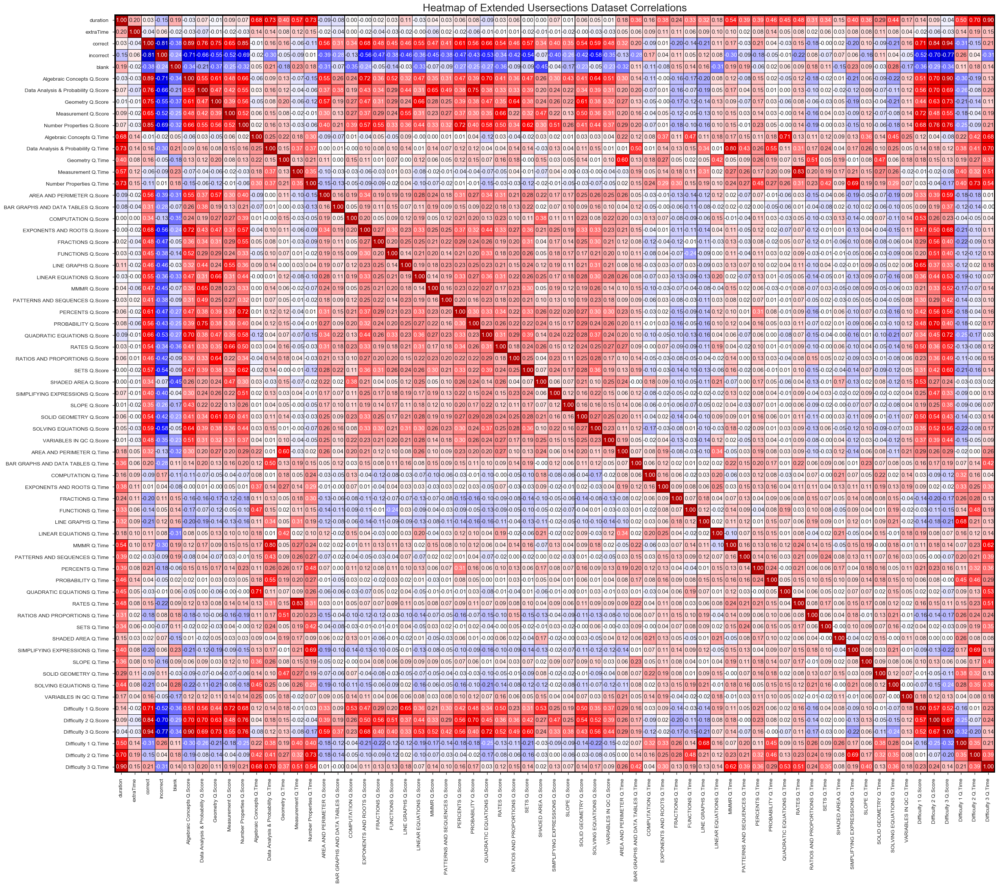

In [10]:
# Plotting heatmap of extended dataset correlations
plt.figure(figsize=(30,26))
ax = sns.heatmap(df.corr(), annot=True, fmt="0.2f", annot_kws={'fontsize': 11},
                 cmap='seismic', vmin=-1.25, vmax=1.25, cbar=False,
                 linewidths=.1, linecolor='black')
ax.axhline(y=0, color='k',linewidth=5)
ax.axhline(y=df.corr().shape[1], color='k',linewidth=5)
ax.axvline(x=0, color='k',linewidth=5)
ax.axvline(x=df.corr().shape[0], color='k',linewidth=5)
plt.title(f'Heatmap of Extended Usersections Dataset Correlations', fontdict={'fontsize': 20})
plt.show()

#### Figure 1. Heatmap of Extended Usersections Dataset Correlations
Score-based attributes correlated heavily with one another, whereas time-based attributes only exhibited moderate intra-group correlation.

## Creating KMeans cluster model based on all available attributes

In [11]:
# Fitting KMeans cluster model to data
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4, random_state=42).fit(df.values)
predictions = kmeans.predict(df.values)
predictions

array([0, 1, 2, ..., 1, 0, 1])

Initial modeling and visualization began using 8 clusters. After determining the extent of overlap between certain cluster distributions, the number of clusters was reduced intially to 6  and finally to 4. 

In [12]:
# Returning cluster centromeres
df_res = pd.DataFrame(kmeans.cluster_centers_, columns=df.columns)
df_res

,duration,extraTime,correct,incorrect,blank,Algebraic Concepts Q.Score,Data Analysis & Probability Q.Score,Geometry Q.Score,Measurement Q.Score,Number Properties Q.Score,Algebraic Concepts Q.Time,Data Analysis & Probability Q.Time,Geometry Q.Time,Measurement Q.Time,Number Properties Q.Time,AREA AND PERIMETER Q.Score,BAR GRAPHS AND DATA TABLES Q.Score,COMPUTATION Q.Score,EXPONENTS AND ROOTS Q.Score,FRACTIONS Q.Score,FUNCTIONS Q.Score,LINE GRAPHS Q.Score,LINEAR EQUATIONS Q.Score,MMMR Q.Score,PATTERNS AND SEQUENCES Q.Score,PERCENTS Q.Score,PROBABILITY Q.Score,QUADRATIC EQUATIONS Q.Score,RATES Q.Score,RATIOS AND PROPORTIONS Q.Score,SETS Q.Score,SHADED AREA Q.Score,SIMPLIFYING EXPRESSIONS Q.Score,SLOPE Q.Score,SOLID GEOMETRY Q.Score,SOLVING EQUATIONS Q.Score,VARIABLES IN QC Q.Score,AREA AND PERIMETER Q.Time,BAR GRAPHS AND DATA TABLES Q.Time,COMPUTATION Q.Time,EXPONENTS AND ROOTS Q.Time,FRACTIONS Q.Time,FUNCTIONS Q.Time,LINE GRAPHS Q.Time,LINEAR EQUATIONS Q.Time,MMMR Q.Time,PATTERNS AND SEQUENCES Q.Time,PERCENTS Q.Time,PROBABILITY Q.Time,QUADRATIC EQUATIONS Q.Time,RATES Q.Time,RATIOS AND PROPORTIONS Q.Time,SETS Q.Time,SHADED AREA Q.Time,SIMPLIFYING EXPRESSIONS Q.Time,SLOPE Q.Time,SOLID GEOMETRY Q.Time,SOLVING EQUATIONS Q.Time,VARIABLES IN QC Q.Time,Difficulty 1 Q.Score,Difficulty 2 Q.Score,Difficulty 3 Q.Score,Difficulty 1 Q.Time,Difficulty 2 Q.Time,Difficulty 3 Q.Time
0,0.453639,0.064965,0.389791,0.560795,0.049414,0.289179,0.416344,0.258121,0.624710,0.440320,0.136068,0.271478,0.190096,0.231414,0.290887,0.263341,0.083527,0.832947,0.349768,0.227378,0.313225,0.677494,0.255220,0.279582,0.197216,0.395592,0.541183,0.263728,0.511601,0.143852,0.076566,0.946636,0.399072,0.350348,0.530162,0.299304,0.327146,0.089955,0.140865,0.199991,0.096724,0.160551,0.057665,0.057796,0.165025,0.199724,0.138599,0.231818,0.152620,0.064307,0.203653,0.111615,0.048985,0.055336,0.153187,0.094706,0.104004,0.229523,0.051621,0.743329,0.413509,0.237703,0.176833,0.295443,0.292639
1,0.469445,0.035789,0.796017,0.197667,0.006316,0.766699,0.721170,0.780000,0.895789,0.869474,0.134715,0.322619,0.209311,0.225176,0.262279,0.649474,0.345263,0.949474,0.714737,0.926316,0.884211,0.956842,0.913684,0.667368,0.715789,0.843158,0.784737,0.765614,0.830526,0.757895,0.797895,0.957895,0.907368,0.787368,0.894737,0.848421,0.833684,0.136510,0.199698,0.139761,0.090227,0.106034,0.044424,0.044119,0.162916,0.275389,0.126169,0.297765,0.155216,0.065203,0.245536,0.086468,0.048515,0.046197,0.116845,0.120265,0.081561,0.177078,0.063747,0.957105,0.845848,0.709158,0.125277,0.261647,0.355376
2,0.497788,0.066667,0.569321,0.398734,0.031945,0.475020,0.566166,0.468018,0.782883,0.637838,0.161650,0.295312,0.200674,0.229226,0.299201,0.319820,0.082883,0.891892,0.453153,0.783784,0.499099,0.863063,0.639640,0.390991,0.585586,0.598198,0.689640,0.407207,0.651351,0.374775,0.273874,0.972973,0.592793,0.522523,0.755856,0.610811,0.672072,0.119934,0.155821,0.167335,0.098194,0.126419,0.066038,0.052502,0.178592,0.227966,0.141092,0.279369,0.161471,0.077681,0.224664,0.095621,0.060563,0.049417,0.144071,0.121958,0.091263,0.234432,0.060612,0.888964,0.662462,0.399550,0.154718,0.302501,0.345239
3,0.468324,0.041916,0.334035,0.441819,0.224146,0.263473,0.418496,0.167665,0.429641,0.367265,0.135989,0.312079,0.134533,0.255256,0.289136,0.071856,0.155689,0.221557,0.282934,0.634731,0.491018,0.664671,0.113772,0.386228,0.305389,0.230539,0.453593,0.291417,0.287425,0.287425,0.263473,0.095808,0.514970,0.395210,0.425150,0.416168,0.095808,0.041217,0.156262,0.090776,0.076324,0.177761,0.070638,0.065392,0.070747,0.273608,0.138469,0.163264,0.144900,0.077595,0.200357,0.131507,0.057161,0.020565,0.186496,0.110557,0.075436,0.280213,0.025286,0.510479,0.401863,0.232934,0.160317,0.296276,0.316136


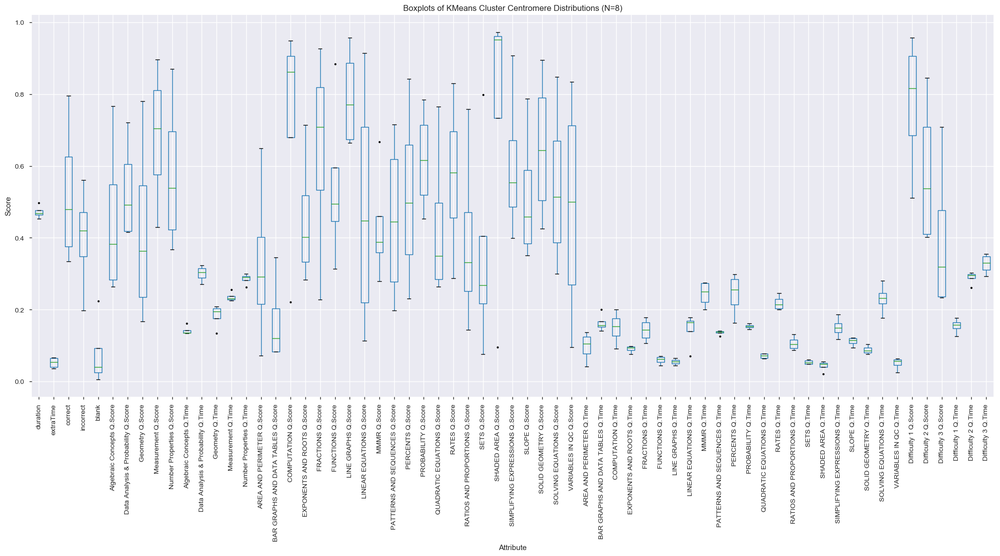

In [13]:
# Plotting KMeans cluster centromere differences using boxplots
plt.figure(figsize=(25, 10))
df_res.boxplot(column=list(df_res.columns), sym='k.')
locs, labels = plt.xticks()
plt.setp(labels, rotation=90)
plt.xlabel('Attribute')
plt.ylabel('Score')
plt.title('Boxplots of KMeans Cluster Centromere Distributions (N=8)')
plt.show()

#### Figure 2. Boxplots of KMeans cluster centromere distributions for general model
When utilizing all extended dataset attributes, the KMeans model showed heavy preference towards score-based attributes when differentiating clusters. In contrast, the inter-cluster differences between time-based attributes were significantly lower.

In [14]:
# Inserting kmeans cluster labels into extended usersections dataset
df_pred = pd.DataFrame(predictions)
df_pred.index = df.index
df.insert(0,"clusterGroup", df_pred)
df

,clusterGroup,duration,extraTime,correct,incorrect,blank,Algebraic Concepts Q.Score,Data Analysis & Probability Q.Score,Geometry Q.Score,Measurement Q.Score,Number Properties Q.Score,Algebraic Concepts Q.Time,Data Analysis & Probability Q.Time,Geometry Q.Time,Measurement Q.Time,Number Properties Q.Time,AREA AND PERIMETER Q.Score,BAR GRAPHS AND DATA TABLES Q.Score,COMPUTATION Q.Score,EXPONENTS AND ROOTS Q.Score,FRACTIONS Q.Score,FUNCTIONS Q.Score,LINE GRAPHS Q.Score,LINEAR EQUATIONS Q.Score,MMMR Q.Score,PATTERNS AND SEQUENCES Q.Score,PERCENTS Q.Score,PROBABILITY Q.Score,QUADRATIC EQUATIONS Q.Score,RATES Q.Score,RATIOS AND PROPORTIONS Q.Score,SETS Q.Score,SHADED AREA Q.Score,SIMPLIFYING EXPRESSIONS Q.Score,SLOPE Q.Score,SOLID GEOMETRY Q.Score,SOLVING EQUATIONS Q.Score,VARIABLES IN QC Q.Score,AREA AND PERIMETER Q.Time,BAR GRAPHS AND DATA TABLES Q.Time,COMPUTATION Q.Time,EXPONENTS AND ROOTS Q.Time,FRACTIONS Q.Time,FUNCTIONS Q.Time,LINE GRAPHS Q.Time,LINEAR EQUATIONS Q.Time,MMMR Q.Time,PATTERNS AND SEQUENCES Q.Time,PERCENTS Q.Time,PROBABILITY Q.Time,QUADRATIC EQUATIONS Q.Time,RATES Q.Time,RATIOS AND PROPORTIONS Q.Time,SETS Q.Time,SHADED AREA Q.Time,SIMPLIFYING EXPRESSIONS Q.Time,SLOPE Q.Time,SOLID GEOMETRY Q.Time,SOLVING EQUATIONS Q.Time,VARIABLES IN QC Q.Time,Difficulty 1 Q.Score,Difficulty 2 Q.Score,Difficulty 3 Q.Score,Difficulty 1 Q.Time,Difficulty 2 Q.Time,Difficulty 3 Q.Time
userSectionId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
62341,0,0.361050,0,0.378378,0.621622,0.000000,0.181818,0.222222,0.50,0.75,0.555556,0.094924,0.247759,0.204871,0.180285,0.234890,0.5,0.0,0.0,0.25,0.0,0.0,0.5,1.0,0.0,0.0,0.5,0.50,0.666667,0.5,0.0,1.0,1.0,0.0,0.0,0.5,0.5,0.0,0.074453,0.155502,0.141104,0.074611,0.058140,0.032064,0.056714,0.311111,0.13625,0.106965,0.359580,0.179856,0.060016,0.122896,0.126126,0.071116,0.077748,0.047506,0.033932,0.087237,0.114355,0.041451,0.750,0.222222,0.30,0.172392,0.230082,0.237803
64774,1,0.613786,0,0.729730,0.270270,0.000000,0.636364,0.777778,0.75,0.75,0.777778,0.157691,0.391165,0.306590,0.312581,0.326923,0.5,0.0,1.0,0.50,1.0,0.0,1.0,1.0,0.5,1.0,1.0,1.00,0.666667,0.5,1.0,1.0,1.0,0.0,1.0,0.5,1.0,1.0,0.153285,0.160287,0.276074,0.099482,0.162791,0.073146,0.076923,0.125926,0.24875,0.283582,0.469816,0.195272,0.049493,0.324916,0.153153,0.056893,0.064343,0.087886,0.201597,0.121163,0.323601,0.031088,1.000,0.666667,0.65,0.196565,0.315247,0.429707
65193,2,0.611233,0,0.702703,0.297297,0.000000,0.636364,0.777778,0.50,0.75,0.777778,0.153041,0.362356,0.240688,0.487678,0.300137,0.5,0.0,1.0,0.75,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.75,1.000000,0.5,0.0,0.0,1.0,0.0,0.0,1.0,0.5,1.0,0.084672,0.172249,0.079755,0.054922,0.110465,0.061122,0.043677,0.162963,0.32250,0.199005,0.485564,0.169579,0.095869,0.550505,0.148649,0.037199,0.096515,0.125891,0.189621,0.100162,0.119221,0.023316,1.000,0.666667,0.60,0.137405,0.313187,0.461872
65264,2,0.617797,0,0.405405,0.378378,0.216216,0.272727,0.555556,0.00,0.50,0.555556,0.202635,0.211908,0.177650,0.268482,0.532280,0.0,0.0,1.0,0.00,1.0,0.0,1.0,0.0,0.0,1.0,0.5,0.75,0.333333,0.5,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.051095,0.148325,0.319018,0.056995,0.093023,0.224449,0.077575,0.148148,0.16250,0.109453,0.188976,0.108941,0.074435,0.225589,0.128378,0.056893,0.029491,0.510689,0.077844,0.077544,0.457421,0.041451,0.750,0.555556,0.20,0.171756,0.631181,0.281532
65296,2,0.534282,0,0.594595,0.405405,0.000000,0.363636,0.555556,0.75,0.75,0.777778,0.135219,0.350192,0.144699,0.278859,0.356456,0.5,0.0,1.0,0.50,1.0,0.0,1.0,1.0,0.0,1.0,0.5,0.75,0.333333,0.5,1.0,0.0,1.0,1.0,1.0,1.0,0.5,0.0,0.094891,0.071770,0.208589,0.101554,0.104651,0.037074,0.036506,0.162963,0.16125,0.151741,0.146982,0.352518,0.127436,0.279461,0.042793,0.035011,0.040214,0.188836,0.105788,0.098546,0.158151,0.067358,1.000,0.777778,0.35,0.129135,0.414835,0.336827
65377,2,0.927425,1,0.513514,0.486486,0.000000,0.454545,0.444444,0.50,0.75,0.555556,0.304146,0.609475,0.351003,0.271077,0.424451,0.5,0.0,1.0,0.25,1.0,0.0,1.0,0.0,0.5,0.0,0.5,0.50,0.000000

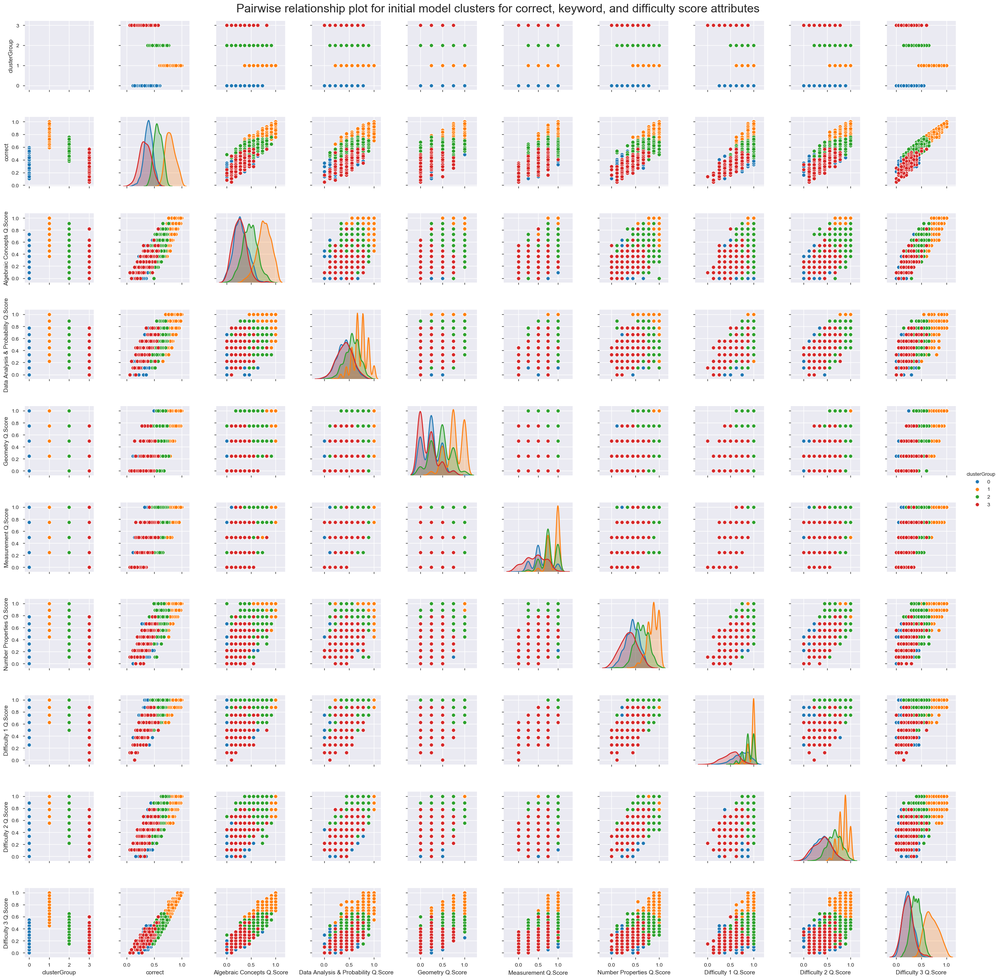

In [15]:
# Visualizing total correct, keyword, and difficulty score relationships using pairwise plot
df_viz_score = df[['clusterGroup', 'correct', 'Algebraic Concepts Q.Score',
                   'Data Analysis & Probability Q.Score', 'Geometry Q.Score', 
                   'Measurement Q.Score', 'Number Properties Q.Score',
                   'Difficulty 1 Q.Score', 'Difficulty 2 Q.Score', 'Difficulty 3 Q.Score']]
sns.pairplot(df_viz_score, hue="clusterGroup")
plt.suptitle(('Pairwise relationship plot for initial model clusters '
              'for correct, keyword, and difficulty score attributes'), y=1.01, fontsize=22)
plt.show()

#### Figure 3. Pairwise relationship plot for initial model clusters for correct, keyword, and difficulty score attributes
Most score-based attributes show a high degree of differentiation in cluster distributions, the most obvious of which would be the 'correct' attribute, where cluster 3 (red), cluster 0 (blue), cluster 2 (green), and cluster 1 (yellow) largely describe the Q1, Q2, Q3, and Q4 quartiles respectively. For other attributes, we see considerable overlap between clusters 3 and 0 (Algebraic Concepts, Data Analysis & Prob., Difficulty 3 Score), and some occasional overlap between clusters 2 and 1 (Measurement, Difficulty 1 Score).

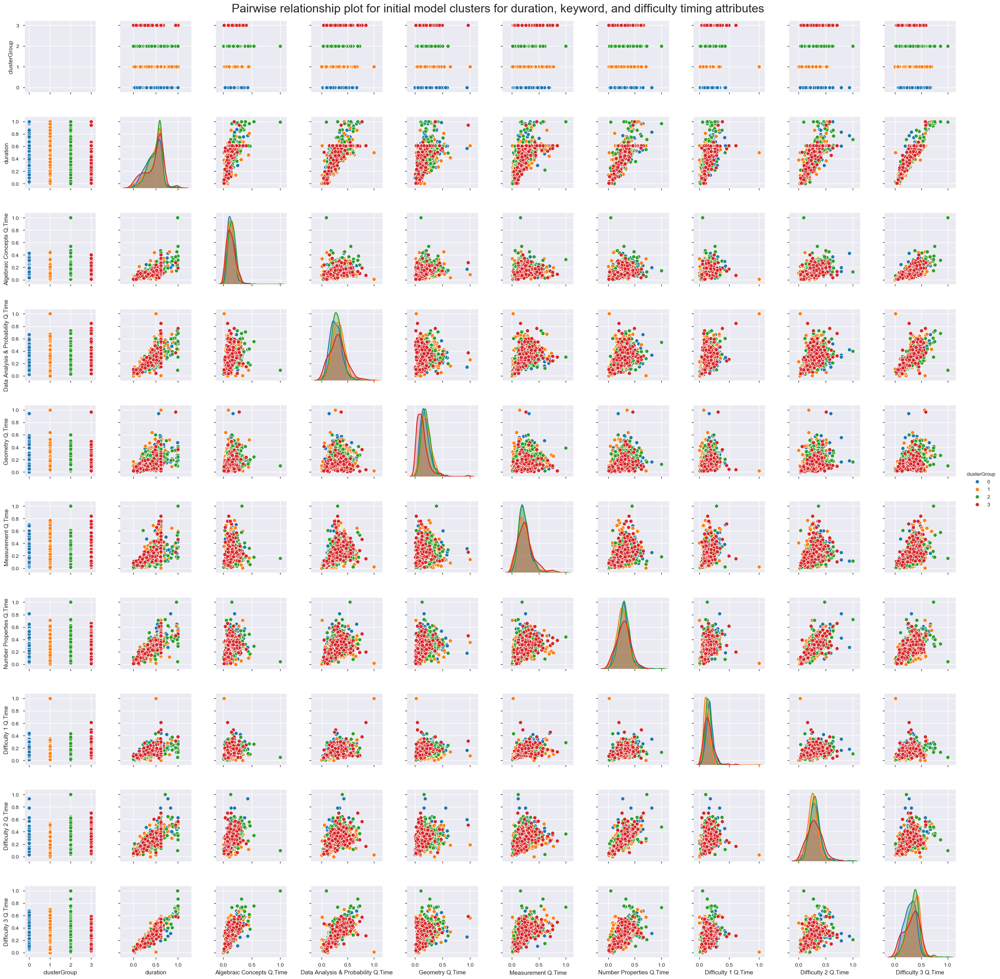

In [16]:
# Visualizing total duration, keyword, and difficulty timing relationships using pairwise plot
df_viz_timing = df[['clusterGroup', 'duration', 'Algebraic Concepts Q.Time',
                    'Data Analysis & Probability Q.Time', 'Geometry Q.Time',
                    'Measurement Q.Time', 'Number Properties Q.Time',
                    'Difficulty 1 Q.Time', 'Difficulty 2 Q.Time', 'Difficulty 3 Q.Time']]
sns.pairplot(df_viz_timing, hue="clusterGroup")
plt.suptitle(('Pairwise relationship plot for initial model clusters for '
              'duration, keyword, and difficulty timing attributes'), y=1.01, fontsize=22)
plt.show()

#### Figure 4. Pairwise relationship plot for initial model clusters for duration, keyword, and difficulty time attributes
Unlike Figure 3's score-based attributes, there is little to no differentiation between cluster distributions for time-based attributes. Removing most score-based attributes from the model should allow the clustering algorithm to better define group differences.

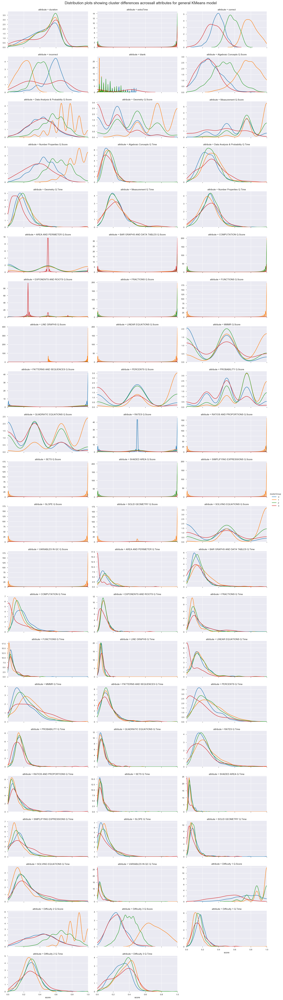

In [17]:
# Visualizing cluster distribution differences for all attributes for general KMeans model
df_melt = df.melt(['clusterGroup'], var_name='attribute', value_name='score')
g = sns.FacetGrid(df_melt, col='attribute', hue="clusterGroup", aspect=2, 
                  sharey=False, sharex=True, xlim=(0,1), col_wrap=3, legend_out=True)
g = g.map(sns.distplot, 'score', hist=False, rug=False).add_legend()
plt.suptitle(('Distribution plots showing cluster differences across'
              'all attributes for general KMeans model'), y=1.005, fontsize=18)
plt.show()

#### Figure 5. Distribution plots showing cluster differences across all attributes for general KMeans model
Along with distributions found in Figures 3 & 4, familyDescription category cluster distributions were plotted using a facet grid; however, given the low number of questions for some familyDescriptions categories, many of these distributions are either bi- or tri-modal. One interesting set of cluster distributions is that of the incorrect score attribute, where clusters 0, 1, and 2 largely mirror their distributions for the correct score attribute, yet cluster 3 (red) shows considerable variance in the number of incorrect answers. This is explained by the blank attribute, where the distribution of cluster 3 also shows considerable variance in the number of answers left blank.

## Creating model based solely on timing attributes (incl. total correct)

In [18]:
# Fitting KMeans cluster model to just timing attributes as well as correct score
df_times = df[['correct', 'extraTime'] + timecols].copy()
kmeans_times = KMeans(n_clusters=4, random_state=42).fit(df_times.values)
pred_times = kmeans_times.predict(df_times.values)
print(pred_times)

# Returning cluster centromeres
df_res_times = pd.DataFrame(kmeans_times.cluster_centers_, columns=df_times.columns)
df_res_times

[0 3 3 ... 0 0 3]


,correct,extraTime,Algebraic Concepts Q.Time,Data Analysis & Probability Q.Time,Geometry Q.Time,Measurement Q.Time,Number Properties Q.Time,AREA AND PERIMETER Q.Time,BAR GRAPHS AND DATA TABLES Q.Time,COMPUTATION Q.Time,EXPONENTS AND ROOTS Q.Time,FRACTIONS Q.Time,FUNCTIONS Q.Time,LINE GRAPHS Q.Time,LINEAR EQUATIONS Q.Time,MMMR Q.Time,PATTERNS AND SEQUENCES Q.Time,PERCENTS Q.Time,PROBABILITY Q.Time,QUADRATIC EQUATIONS Q.Time,RATES Q.Time,RATIOS AND PROPORTIONS Q.Time,SETS Q.Time,SHADED AREA Q.Time,SIMPLIFYING EXPRESSIONS Q.Time,SLOPE Q.Time,SOLID GEOMETRY Q.Time,SOLVING EQUATIONS Q.Time,VARIABLES IN QC Q.Time,Difficulty 1 Q.Time,Difficulty 2 Q.Time,Difficulty 3 Q.Time,duration
0,0.531843,2.983724e-16,0.091122,0.183845,0.139903,0.142521,0.186585,0.082155,0.110523,0.145821,0.069600,0.094317,0.035895,0.040886,0.131973,0.126072,0.086071,0.161613,0.113494,0.046761,0.138065,0.069616,0.032499,0.039172,0.092375,0.072055,0.066257,0.144808,0.045261,0.116316,0.196286,0.195487,0.268255
1,0.431209,3.053113e-16,0.171282,0.335519,0.199046,0.277026,0.341270,0.086440,0.167938,0.179106,0.102733,0.177227,0.081013,0.065211,0.148232,0.266462,0.164104,0.232774,0.173796,0.082631,0.242380,0.134566,0.064101,0.049451,0.197127,0.120092,0.105959,0.305656,0.052776,0.189661,0.351374,0.366398,0.565124
2,0.531734,1.000000e+00,0.185687,0.367550,0.226200,0.290313,0.351602,0.126384,0.194855,0.202109,0.118822,0.191142,0.073315,0.066134,0.207574,0.298244,0.143580,0.314076,0.195469,0.082641,0.268093,0.108715,0.065904,0.051571,0.179215,0.143556,0.119566,0.266519,0.065524,0.190968,0.368610,0.404092,0.613064
3,0.724829,3.122502e-16,0.156714,0.349100,0.228560,0.252560,0.303558,0.150111,0.202609,0.146857,0.099892,0.118686,0.051871,0.048622,0.185538,0.298471,0.149254,0.361753,0.167152,0.076848,0.267960,0.093374,0.059396,0.050766,0.127165,0.136094,0.090365,0.196296,0.065260,0.141010,0.291336,0.400491,0.539756


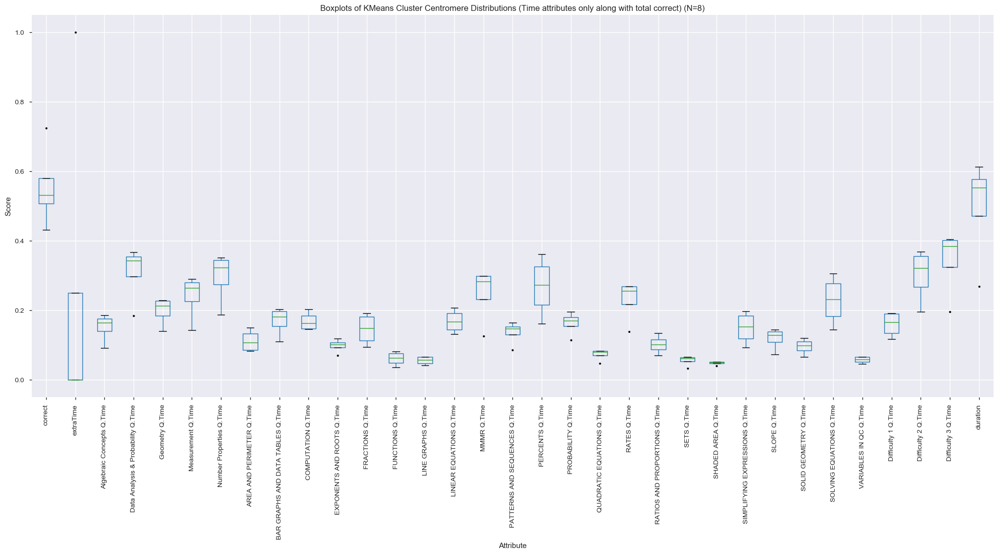

In [19]:
# Plotting KMeans cluster centromere differences using boxplots for time attributes
plt.figure(figsize=(25, 10))
df_res_times.boxplot(column=list(df_res_times.columns), sym='k.')
locs, labels = plt.xticks()
plt.setp(labels, rotation=90)
plt.xlabel('Attribute')
plt.ylabel('Score')
plt.title(('Boxplots of KMeans Cluster Centromere Distributions '
           '(Time attributes only along with total correct) (N=8)'))
plt.show()

#### Figure 7. Boxplots of KMeans cluster centromere distributions for time-based model
When reducing the dataset to time-based attributes while retaining the correct score attribute, there is far more variance between cluster centromeres on time-based attributes. Notable examples include extraTime (binary variant of totalDuration attribute), duration, difficulty 2 & 3 Q.times, and Percents Q.Time.

In [20]:
# Inserting kmeans cluster labels into extended usersections timing dataset
df_pred_times = pd.DataFrame(pred_times)
df_pred_times.index = df_times.index
df_times.insert(0,"clusterGroup", df_pred_times)
df_times

,clusterGroup,correct,extraTime,Algebraic Concepts Q.Time,Data Analysis & Probability Q.Time,Geometry Q.Time,Measurement Q.Time,Number Properties Q.Time,AREA AND PERIMETER Q.Time,BAR GRAPHS AND DATA TABLES Q.Time,COMPUTATION Q.Time,EXPONENTS AND ROOTS Q.Time,FRACTIONS Q.Time,FUNCTIONS Q.Time,LINE GRAPHS Q.Time,LINEAR EQUATIONS Q.Time,MMMR Q.Time,PATTERNS AND SEQUENCES Q.Time,PERCENTS Q.Time,PROBABILITY Q.Time,QUADRATIC EQUATIONS Q.Time,RATES Q.Time,RATIOS AND PROPORTIONS Q.Time,SETS Q.Time,SHADED AREA Q.Time,SIMPLIFYING EXPRESSIONS Q.Time,SLOPE Q.Time,SOLID GEOMETRY Q.Time,SOLVING EQUATIONS Q.Time,VARIABLES IN QC Q.Time,Difficulty 1 Q.Time,Difficulty 2 Q.Time,Difficulty 3 Q.Time,duration
userSectionId,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
62341,0,0.378378,0,0.094924,0.247759,0.204871,0.180285,0.234890,0.074453,0.155502,0.141104,0.074611,0.058140,0.032064,0.056714,0.311111,0.13625,0.106965,0.359580,0.179856,0.060016,0.122896,0.126126,0.071116,0.077748,0.047506,0.033932,0.087237,0.114355,0.041451,0.172392,0.230082,0.237803,0.361050
64774,3,0.729730,0,0.157691,0.391165,0.306590,0.312581,0.326923,0.153285,0.160287,0.276074,0.099482,0.162791,0.073146,0.076923,0.125926,0.24875,0.283582,0.469816,0.195272,0.049493,0.324916,0.153153,0.056893,0.064343,0.087886,0.201597,0.121163,0.323601,0.031088,0.196565,0.315247,0.429707,0.613786
65193,3,0.702703,0,0.153041,0.362356,0.240688,0.487678,0.300137,0.084672,0.172249,0.079755,0.054922,0.110465,0.061122,0.043677,0.162963,0.32250,0.199005,0.485564,0.169579,0.095869,0.550505,0.148649,0.037199,0.096515,0.125891,0.189621,0.100162,0.119221,0.023316,0.137405,0.313187,0.461872,0.611233
65264,1,0.405405,0,0.202635,0.211908,0.177650,0.268482,0.532280,0.051095,0.148325,0.319018,0.056995,0.093023,0.224449,0.077575,0.148148,0.16250,0.109453,0.188976,0.108941,0.074435,0.225589,0.128378,0.056893,0.029491,0.510689,0.077844,0.077544,0.457421,0.041451,0.171756,0.631181,0.281532,0.617797
65296,1,0.594595,0,0.135219,0.350192,0.144699,0.278859,0.356456,0.094891,0.071770,0.208589,0.101554,0.104651,0.037074,0.036506,0.162963,0.16125,0.151741,0.146982,0.352518,0.127436,0.279461,0.042793,0.035011,0.040214,0.188836,0.105788,0.098546,0.158151,0.067358,0.129135,0.414835,0.336827,0.534282
65377,2,0.513514,1,0.304146,0.609475,0.351003,0.271077,0.424451,0.229197,0.404306,0.269939,0.072539,0.191860,0.082164,0.078227,0.214815,0.71625,0.092040,0.362205,0.160329,0.156664,0.240741,0.150901,0.076586,0.058981,0.175772,0.431138,0.103393,0.447689,0.067358,0.192112,0.354396,0.722443,0.927425
65404,0,0.567568,0,0.108873,0.205506,0.157593,0.132296,0.168956,0.094891,0.215311,0.067485,0.094301,0.093023,0.022044,0.029987,0.096296,0.14375,0.052239,0.178478,0.102775,0.035074,0.143098,0.031532,0.045952,0.018767,0.066508,0.145709,0.105008,0.228710,0.044041,0.104962,0.180632,0.231297,0.289570
65435,3,0.864865,0,0.129795,0.488476,0.395415,0.246433,0.257555,0.080292,0.495215,0.184049,0.088083,0.104651,0.007014,0.052803,0.266667,0.42875,0.079602,0.314961,0.175745,0.047935,0.249158,0.220721,0.025164,0.096515,0.119952,0.215569,0.222940,0.267640,0.025907,0.150127,0.350962,0.433683,0.610139
65440,1,0.351351,0,0.144130,0.347631,0.167622,0.226978,0.347527,0.131387,0.126794,0.601227,0.110881,0.087209,0.047094,0.045632,0.140741,0.20500,0.176617,0.356955,0.253854,0.040920,0.279461,0.065315,0.060175,0.072386,0.067696,0.169661,0.184168,0.214112,0.028497,0.318702,0.291896,0.287315,0.527717


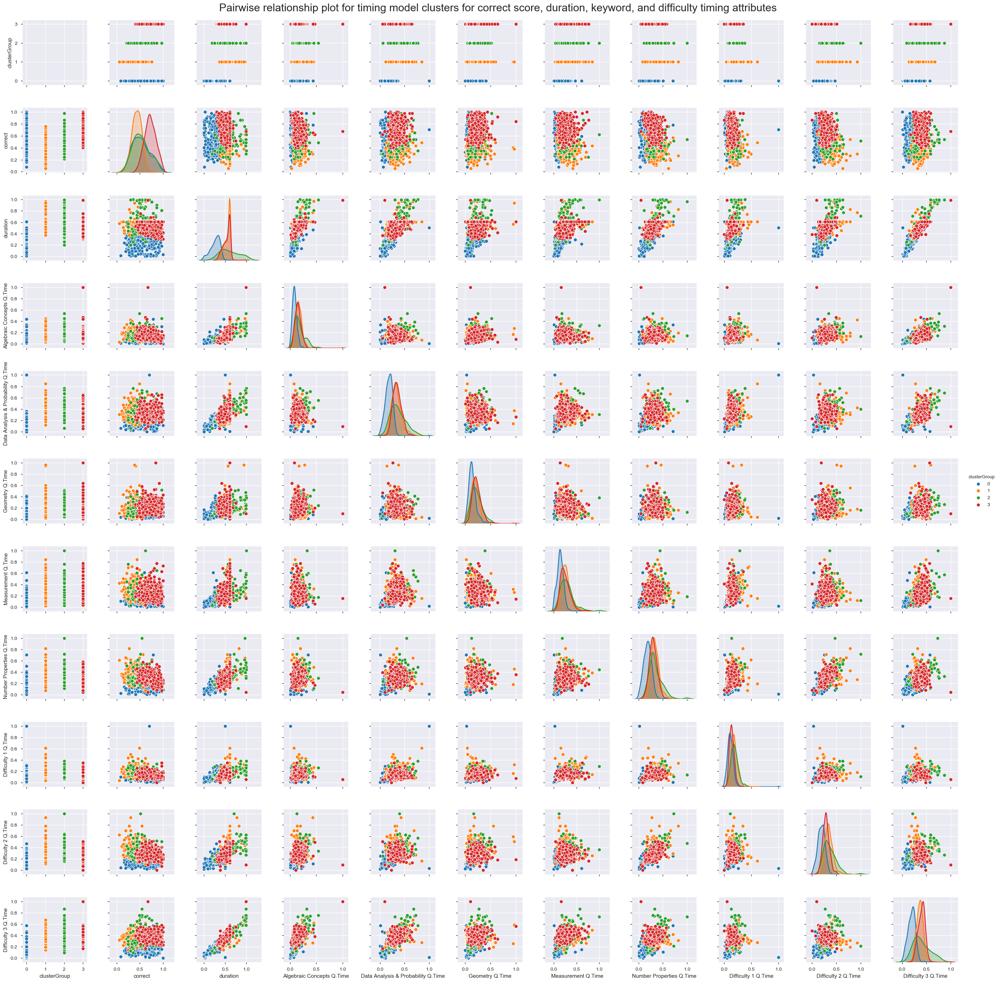

In [21]:
# Visualizing total correct and keyword timing relationships using pairwise relationship plot
df_viz_times = df_times[['clusterGroup', 'correct', 'duration', 'Algebraic Concepts Q.Time',
                         'Data Analysis & Probability Q.Time', 'Geometry Q.Time',
                         'Measurement Q.Time', 'Number Properties Q.Time',
                         'Difficulty 1 Q.Time', 'Difficulty 2 Q.Time', 'Difficulty 3 Q.Time']]
sns.pairplot(df_viz_times, hue="clusterGroup")
plt.suptitle(('Pairwise relationship plot for timing model clusters for correct score,'
              ' duration, keyword, and difficulty timing attributes'), y=1.01, fontsize=22)
plt.show()

#### Figure 8. Pairwise relationship plot for initial model clusters for correct, keyword, and difficulty score attributes
As with Figure 7, we see a greater degree of differentiation in cluster distributions for time-based attributes than in the general model (Figure 4 & 5). One interesting result is found between clusters 1 (yellow) and 3 (red). While we see a high level of overlap between these distributions in terms of section times, cluster 1 performs considerably worse than cluster 3 in terms of correct score. This suggests that users in cluster 1 try to maintain a proper pace to earn a top score, but are likely moving too quickly through questions given their current ability. Cluster 2 (green) contains most users who have extra time on the exam, and it is interesting to note that this does not necessarily correlate to a top score, suggesting that most users who request extra time truly need it.

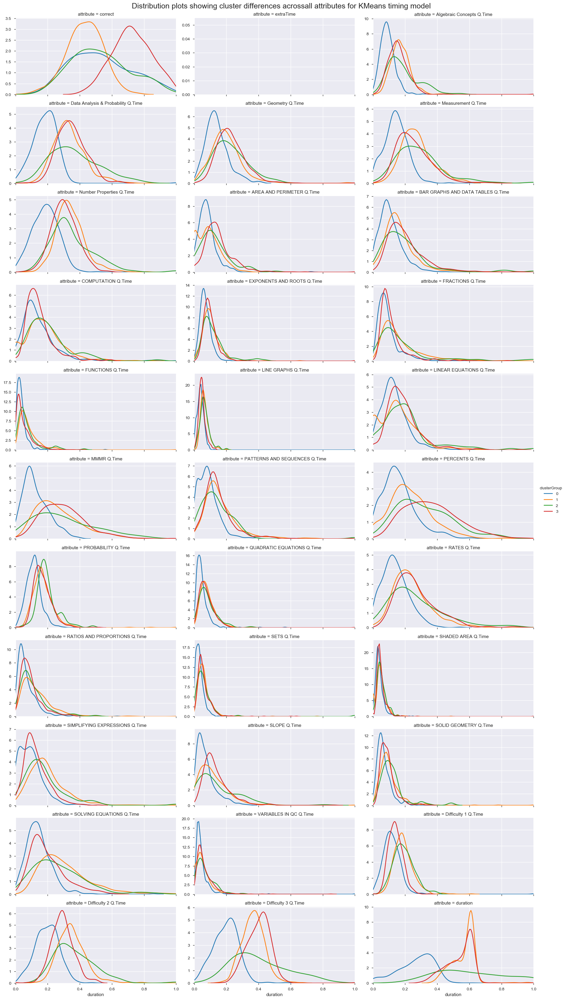

In [22]:
# Visualizing cluster distribution differences for all attributes for general KMeans model
df_timesmelt = df_times.melt(['clusterGroup'], var_name='attribute', value_name='duration')
g = sns.FacetGrid(df_timesmelt, col='attribute', hue="clusterGroup", aspect=2, 
                  sharey=False, sharex=True, xlim=(0,1), col_wrap=3, legend_out=True)
g = g.map(sns.distplot, 'duration', hist=False, rug=False).add_legend()
plt.suptitle(('Distribution plots showing cluster differences across'
              'all attributes for KMeans timing model'), y=1.005, fontsize=18)
plt.show()

#### Figure 9.  Distribution plots showing cluster differences across all attributes for time-based KMeans model
Along with distributions found in Figures 7 & 8, familyDescription category cluster distributions were plotted using a facet grid. Some interesting results not already discussed above concern cluster 0 (blue). Users in this group score roughly on par with cluster 2 (green), though are far faster on average than users in the other clusters. This is especially apparent when looking at the distributions for Difficulty 2 and 3 Q.Times, as well as keyword categories such as Data Analysis and Prob., Geometry, Number Properties, and Measurement Q.Times. While some users in this cluster earn a top score, the average user does not, suggesting that users in this group need to spend more time on the more difficult questions, as they generally have plenty of time to spare.

## Handling new user data in JSON format

In [23]:
# Converting a user's results into a json file for proof-of-concept
df_newuser = df_init[df_init['userSectionId'] == 66233] # pulling from original csv
newuser_json = df_newuser.to_json(orient='records')
newuser_json

'[{"userSectionId":66233,"duration":1771,"totalDuration":2100,"correct":24,"incorrect":13,"blank":0,"questionCount":37,"answer":"c","correct.1":0,"questionSectionId":6845,"duration.1":65,"flagged":0,"questionType":"basic","keywordId":6,"keyword":"Algebraic Concepts","bankId":135,"bankDescription":"Solving for Missing Constants with FOIL","difficulty":3,"familyId":42,"familyDescription":"QUADRATIC EQUATIONS"},{"userSectionId":66233,"duration":1771,"totalDuration":2100,"correct":24,"incorrect":13,"blank":0,"questionCount":37,"answer":"b","correct.1":0,"questionSectionId":6846,"duration.1":50,"flagged":0,"questionType":"basic","keywordId":18,"keyword":"Number Properties","bankId":95,"bankDescription":"Max\\/Min of Quadratic Expression, given Domain","difficulty":3,"familyId":42,"familyDescription":"QUADRATIC EQUATIONS"},{"userSectionId":66233,"duration":1771,"totalDuration":2100,"correct":24,"incorrect":13,"blank":0,"questionCount":37,"answer":"b","correct.1":1,"questionSectionId":6847,"d

In [24]:
def JsonUserClusterPrediction(newuser_json):
    
    ''' 
    Input: JSON string of single user test data
    Output: Cluster Predictions for both General and Timing models 
    '''
    
    df_user = pd.read_json(newuser_json)
    # Pivot table creation
    keyword_scores = pd.pivot_table(df_user, values='correct.1', index=['userSectionId'],
                                    columns=['keyword'], aggfunc=np.sum)
    keyword_scores.columns = [str(col) + ' Q.Score' for col in keyword_scores.columns]
    keyword_timing = pd.pivot_table(df_user, values='duration.1', index=['userSectionId'],
                                    columns=['keyword'], aggfunc=np.sum)
    keyword_timing.columns = [str(col) + ' Q.Time' for col in keyword_timing.columns]
    famdesc_scores = pd.pivot_table(df_user, values='correct.1', index=['userSectionId'],
                                    columns=['familyDescription'], aggfunc=np.sum)
    famdesc_scores.columns = [str(col) + ' Q.Score' for col in famdesc_scores.columns]
    famdesc_timing = pd.pivot_table(df_user, values='duration.1', index=['userSectionId'],
                                    columns=['familyDescription'], aggfunc=np.sum)
    famdesc_timing.columns = [str(col) + ' Q.Time' for col in famdesc_timing.columns]
    difficu_scores = pd.pivot_table(df_user, values='correct.1', index=['userSectionId'],
                                    columns=['difficulty'], aggfunc=np.sum)
    difficu_scores.columns = [' '.join(['Difficulty', str(col), 'Q.Score'])
                              for col in difficu_scores.columns]
    difficu_timing = pd.pivot_table(df_user, values='duration.1', index=['userSectionId'],
                                    columns=['difficulty'], aggfunc=np.sum)
    difficu_timing.columns = [' '.join(['Difficulty', str(col), 'Q.Time'])
                              for col in difficu_timing.columns]
    # Extended dataset creation
    df_userext = pd.DataFrame()
    df_userext['userSectionId'] = df_user['userSectionId'].value_counts().sort_index().index
    initial_cols = ['duration', 'totalDuration', 'correct', 'incorrect', 'blank']
    for col in initial_cols:
        conv = df_user.groupby('userSectionId')[col].agg(max)
        df_userext[col] = df_userext['userSectionId'].map(conv)
    pivots = [keyword_scores, keyword_timing, famdesc_scores,
              famdesc_timing, difficu_scores, difficu_timing]
    for pivot in pivots:
        df_userext = df_userext.join(pivot, on='userSectionId')
    # Scores
    for score in ['correct', 'incorrect', 'blank']:
        df_userext[score] = df_userext[score] / 37
    for keyword in keyword_scores.columns:
        key = keyword.replace(' Q.Score', '')
        df_userext[keyword] = df_userext[keyword] / keyword_qtots[key]
    for famdesc in famdesc_scores.columns:
        fam = famdesc.replace(' Q.Score', '')
        df_userext[famdesc] = df_userext[famdesc] / famdesc_qtots[fam]
    for difficu in difficu_scores.columns:
        diff = difficu.replace(' Q.Score', '')
        df_userext[difficu] = df_userext[difficu] / difficu_qtots[diff]
    # Timings
    conv = {key: tot for key, tot in zip(keyword_timing.index, keyword_timing.sum(axis=1))}
    df_userext['duration'] = df_userext['userSectionId'].map(conv)
    timecols = [col for col in df.columns if col.endswith('Q.Time')]
    timecols.append('duration')
    for col in timecols:
        min_ = minmax_colinfo[col][0]
        max_ = minmax_colinfo[col][1]
        df_userext[col] = (df_userext[col] - min_) / (max_ - min_)
    df_userext = df_userext.rename(columns={'totalDuration': 'extraTime'})
    df_userext['extraTime'] = df_userext['extraTime'].replace({2100: 0, 3150: 1})
    df_userext.index = df_userext['userSectionId']
    df_userext = df_userext.drop('userSectionId', axis=1)
    # Model CLuster Group Predictions
    full_model_pred = kmeans.predict(df_userext.values)[0]
    df_userext_times = df_userext[['correct', 'extraTime'] + timecols].copy()
    time_model_pred = kmeans_times.predict(df_userext_times.values)[0]
    
    user = df_userext.index[0]
    
    return (f'User {user} would fit into cluster {full_model_pred} '
            f'for the general model and cluster {time_model_pred} for the timing model')

JsonUserClusterPrediction(newuser_json)

'User 66233 would fit into cluster 2 for the general model and cluster 3 for the timing model'

In [25]:
# Verifying result
full_model_veri = df.loc[df.index == 66233, 'clusterGroup'].values[0]
time_model_veri = df_times.loc[df_times.index == 66233, 'clusterGroup'].values[0]
print('Original cluster groups for user 66233')
print('General model cluster:', full_model_veri)
print('Timing model cluster:', time_model_veri)

Original cluster groups for user 66233
General model cluster: 2
Timing model cluster: 3


## Final Thoughts
There is far more that can be done with regards to improving upon the clustering algorithm. KMeans provides a good starting point, though other models such as AffinityPropagation, AgglomerativeClustering, MeanShift, or SpectralClustering should also be tested. Additionally, preprocessing could have included Principal Component Analysis, which may have let us work at the level of individual questions rather than subsections.